<font face="B Mitra">
<div dir=rtl>

<font size=5>
<b>بارگذاری کتابخانه‌ها و توابع کمکی مورد نیاز</b>
</font>

</div>
</font>




In [37]:
import cv2
import math
import requests # For reading image from URL
import numpy as np
import matplotlib.pylab as plt
from google.colab.patches import cv2_imshow # For displaying image in Google Colab

def read_image_from_url(url):
    # Fetch the content from the url
    response = requests.get(url)
    # Check if the request was successful
    response.raise_for_status()
    # Convert the response content to a numpy array and then to a OpenCV BGR image
    image = cv2.imdecode(np.asarray(bytearray(response.content), dtype="uint8"), cv2.IMREAD_COLOR)
    return image

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۱:</b>
</font>


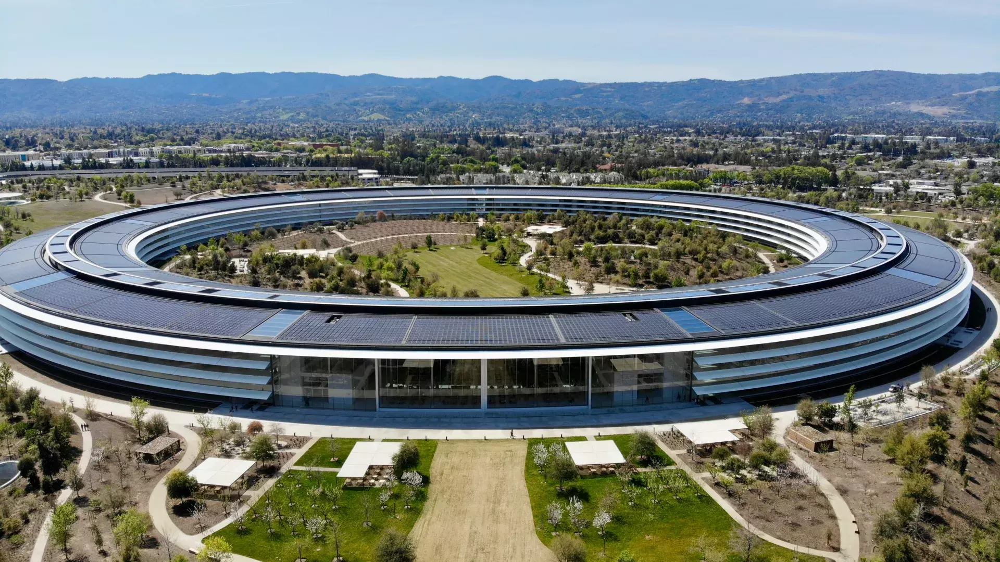

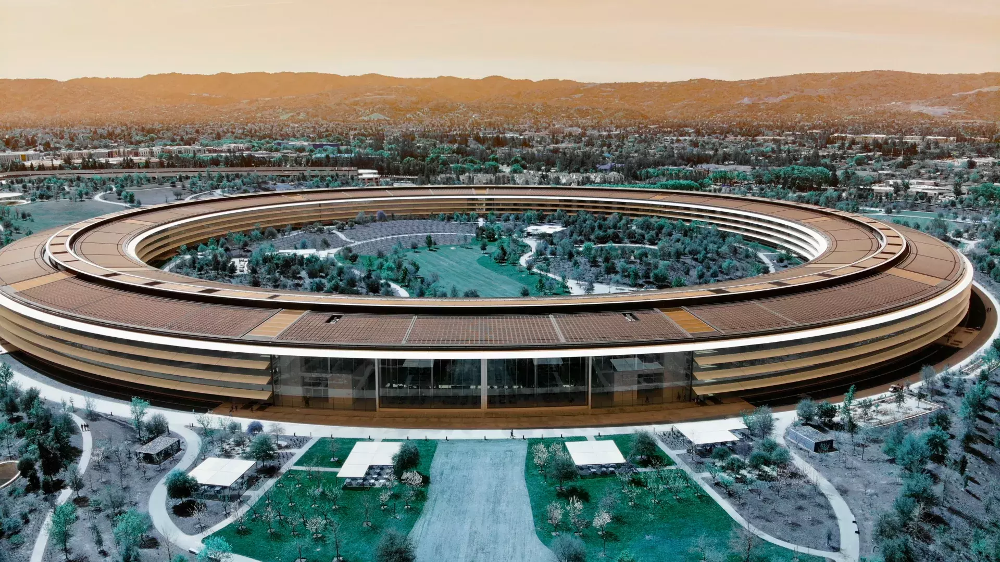

In [38]:
## TODO1: Read and Display an image
url = "https://www.sftravel.com/sites/default/files/styles/hero/public/2022-12/apple-campus-silicon-valley.jpg.webp?itok=pwcoERFq"
myImg = read_image_from_url(url)
### START
cv2_imshow(myImg) # BGR image output
myImg = cv2.cvtColor(myImg , cv2.COLOR_BGR2RGB) # Convert to RGB
cv2_imshow(myImg) # RGB image output
### END

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۲:</b>
</font>

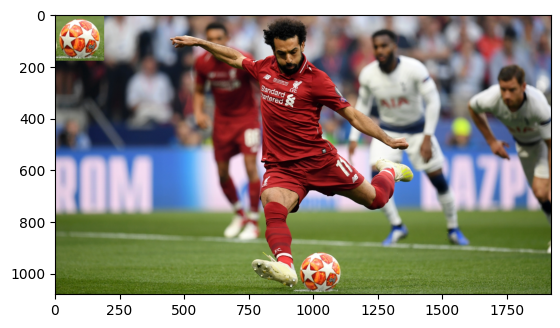

In [39]:
url = "https://www.soccer-training-methods.com/images/salahkicking.jpg"
test_img = read_image_from_url(url)
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
plt.imshow(test_img)
## TODO2: Image ROI
ball = test_img[900:1080, 930:1120]
test_img[0:180, 0:190] = ball
plt.imshow(test_img)

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۳</b>
</font>


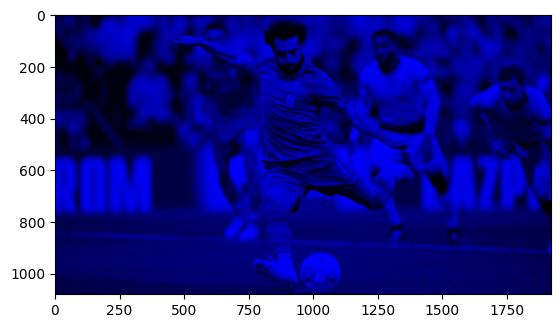

In [40]:
url = "https://www.soccer-training-methods.com/images/salahkicking.jpg"
img = read_image_from_url(url)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

# Split the channels
b, g, r = cv2.split(img)

# Set green and red channels to zero
g.fill(0)
r.fill(0)

# Merge the blue channel with zeroed green and red channels
blue_only = cv2.merge([b, g, r])

# Show the resulting image with only the blue channel in true blue color
plt.imshow(cv2.cvtColor(blue_only, cv2.COLOR_BGR2RGB))
plt.show()


<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۴</b>
</font>

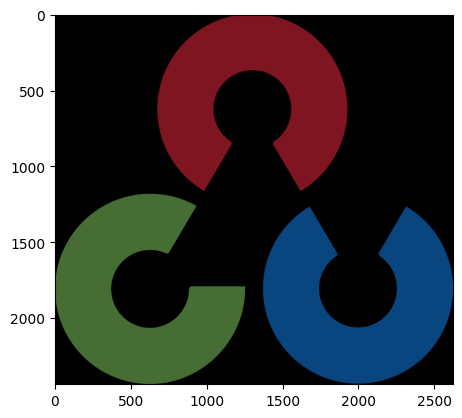

In [41]:
## TODO4
url1 = "https://github.com/opencv/opencv/wiki/logo/OpenCV_logo_no_text.png"
img1 = read_image_from_url(url1)
img2 = np.zeros((img1.shape), np.uint8)
### START
result = cv2.addWeighted(img1, 0.5, img2, 0.5, 0)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
### END

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۵</b>
</font>


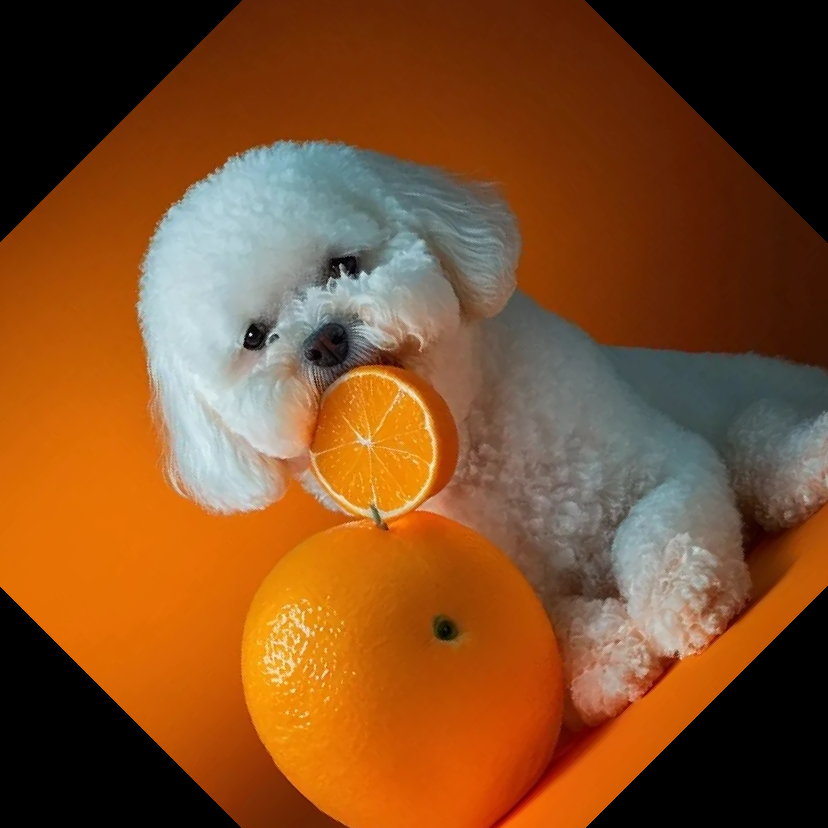

In [42]:
## TODO5:
import math

def rotate_image(img, angle):
    rads = math.radians(angle)

    rot_img = np.uint8(np.zeros(img.shape))

    height, width = rot_img.shape[0], rot_img.shape[1]
    midx,midy = (width//2, height//2)
    for i in range(rot_img.shape[0]):
        for j in range(rot_img.shape[1]):

            x = (i-midx)*math.cos(rads) + (j-midy)*math.sin(rads)
            y = -(i-midx)*math.sin(rads) + (j-midy)*math.cos(rads)

            x = round(x) + midx
            y = round(y) + midy

            if (x>=0 and y>=0 and x<img.shape[0] and  y<img.shape[1]):
                rot_img[i,j,:] = img[x,y,:]

    return rot_img


test_url5 = "https://miro.medium.com/v2/resize:fit:828/format:webp/1*YMJDp-kqus7i-ktWtksNjg.jpeg"
test_img5 = read_image_from_url(test_url5)
rotated_img = rotate_image(test_img5, 45)
cv2_imshow(rotated_img)

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۶</b>
</font>

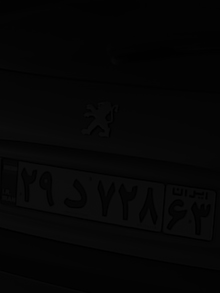

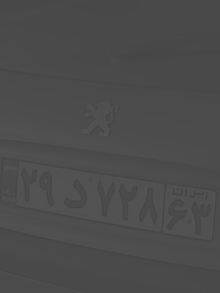

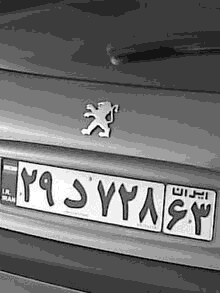

In [43]:
low_contrast_image = read_image_from_url("https://i.ibb.co/Brcmbyt/plate-night.png")
cv2_imshow(low_contrast_image)

brightness = 70 # increase brightness
brightened = cv2.addWeighted(low_contrast_image, 1, np.zeros(low_contrast_image.shape, dtype=low_contrast_image.dtype), 0, brightness)
cv2_imshow(brightened)

contrast = 20 # increase contrast
adjusted = cv2.addWeighted(low_contrast_image, contrast, 0, 0, 0)
cv2_imshow(adjusted)